In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torch.utils.data import random_split
import torchvision.models as models

from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, precision_score

import numpy as np
import pandas as pd
import seaborn as sns
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

import os
import time
import math
import shutil
import soundfile as sf
import scipy.signal
from scipy.io import wavfile

import imageio
import librosa
import librosa.display
from IPython.display import Audio

torch.cuda.is_available()

True

## Display Graphs

#### display_graphs_bool

In [2]:
# Lists to store accuracy values for each epoch
metrics_train_accuracy = []
metrics_val_accuracy = []
metrics_train_loss = []
metrics_val_loss = []
metrics_epoch = []

def display_graphs(epoch, accuracy, val_accuracy, loss, val_loss, csv_dir):
    if isinstance(loss, torch.Tensor):
        loss = loss.cpu()

    loss = loss.detach().numpy()

    metrics_epoch.append(epoch+1)
    metrics_train_accuracy.append(accuracy)
    metrics_val_accuracy.append(val_accuracy)
    metrics_train_loss.append(loss)
    metrics_val_loss.append(val_loss)

    if (epoch+1) % interval == 0 or (epoch-1) == num_epochs:
        if epoch != 0:
            fig, axs = plt.subplots(1, 2, figsize=(20, 6))  # Create a figure with two subplots
            axs[0].plot(metrics_epoch, metrics_train_accuracy, label='Training Accuracy', marker='o', markersize=4, color='#32a852')
            axs[0].plot(metrics_epoch, metrics_val_accuracy, label='Validation Accuracy', marker='o', markersize=4, color='#312af7')
            axs[0].set_xlabel('Epoch')
            axs[0].set_ylabel('Accuracy')
            axs[0].set_title('Training and Validation Accuracy')
            axs[0].set_ylim(acc_min_y, 1)
            axs[0].set_xlim(1, num_epochs)
            axs[0].legend()
            major_ticks = np.arange(0, num_epochs + 1, major_tick_spacing)
            minor_ticks = np.arange(0, num_epochs + 1, 1)
            axs[0].set_xticks(major_ticks)
            axs[0].set_xticks(minor_ticks, minor=True)
            axs[0].set_xticklabels(major_ticks.astype(int))
            axs[0].grid(True, which='both', linestyle='--', alpha=0.5)

            # Plot the loss graph in the second subplot
            axs[1].plot(metrics_epoch, metrics_train_loss, label='Training Loss', marker='o', markersize=4, color='#32a852')
            axs[1].plot(metrics_epoch, metrics_val_loss, label='Validation Loss', marker='o', markersize=4, color='#312af7')
            axs[1].set_xlabel('Epoch')
            axs[1].set_ylabel('Loss')
            axs[1].set_title('Training and Validation Loss')
            axs[1].set_ylim(loss_min_y, loss_max_y)
            axs[1].set_xlim(1, num_epochs)
            axs[1].legend()
            major_ticks = np.arange(0, num_epochs + 1, major_tick_spacing)
            minor_ticks = np.arange(0, num_epochs + 1, 1)
            axs[1].set_xticks(major_ticks)
            axs[1].set_xticks(minor_ticks, minor=True)
            axs[1].set_xticklabels(major_ticks.astype(int))
            axs[1].grid(True, which='both', linestyle='--', alpha=0.5)

            plt.tight_layout()
            plt.show()

            # Create a dictionary with your data
            data = {
                'Epoch': metrics_epoch,
                'Train Accuracy': metrics_train_accuracy,
                'Validation Accuracy': metrics_val_accuracy,
                'Train Loss': metrics_train_loss,
                'Validation Loss': metrics_val_loss
            }

            # Create a pandas DataFrame from your dictionary
            df = pd.DataFrame(data)
            # Save DataFrame to csv
            file_path = os.path.join(csv_dir, 'metrics.csv')
            df.to_csv(file_path, index=False)

#### display_graphs_zoomed_bool

In [3]:
# Lists to store accuracy values for each epoch
metrics_train_accuracy = []
metrics_val_accuracy = []
metrics_train_loss = []
metrics_val_loss = []
metrics_epoch = []

def display_graphs_zoomed(epoch, accuracy, val_accuracy, loss, val_loss):
    if isinstance(loss, torch.Tensor):
        loss = loss.cpu()

    loss = loss.detach().numpy()

    metrics_epoch.append(epoch+1)
    metrics_train_accuracy.append(accuracy)
    metrics_val_accuracy.append(val_accuracy)
    metrics_train_loss.append(loss)
    metrics_val_loss.append(val_loss)

    # calc y limit for accuracy
    if accuracy < val_accuracy:
        acc_y_lim = accuracy
    else:
        acc_y_lim = val_accuracy
    acc_y_lim = acc_y_lim - (acc_y_lim * 0.5)
    # TypeError: can't multiply sequence by non-int of type 'float'

    acc_y_lim = math.floor(acc_y_lim * 10) / 10

    # calc y limit for loss
    if loss > val_loss:
        val_y_lim = loss
    else:
        val_y_lim = val_loss

    if (epoch+1) % interval == 0 or (epoch-1) == num_epochs:
        if epoch != 0:
            fig, axs = plt.subplots(1, 2, figsize=(20, 6))  # Create a figure with two subplots
            # Plot the accuracy graph in the first subplot
            axs[0].plot(metrics_epoch, metrics_train_accuracy, label='Training Accuracy', marker='o', markersize=4, color='#32a852')
            axs[0].plot(metrics_epoch, metrics_val_accuracy, label='Validation Accuracy', marker='o', markersize=4, color='#312af7')
            axs[0].set_xlabel('Epoch')
            axs[0].set_ylabel('Accuracy')
            axs[0].set_title('Training and Validation Accuracy')
            axs[0].set_ylim(acc_y_lim, 1)
            axs[0].set_xlim(1, num_epochs)
            axs[0].grid(True, linestyle='--', alpha=0.5)
            axs[0].legend()
            major_ticks = np.arange(0, num_epochs + 1, major_tick_spacing)
            minor_ticks = np.arange(0, num_epochs + 1, 1)
            axs[1].set_xticks(major_ticks)
            axs[1].set_xticks(minor_ticks, minor=True)
            axs[1].set_xticklabels(major_ticks.astype(int))
            axs[1].grid(True, which='both', linestyle='--', alpha=0.5)

            # Plot the loss graph in the second subplot
            axs[1].plot(metrics_epoch, metrics_train_loss, label='Training Loss', marker='o', markersize=4, color='#32a852')
            axs[1].plot(metrics_epoch, metrics_val_loss, label='Validation Loss', marker='o', markersize=4, color='#312af7')
            axs[1].set_xlabel('Epoch')
            axs[1].set_ylabel('Loss')
            axs[1].set_title('Training and Validation Loss')
            axs[1].set_ylim(0, val_y_lim)
            axs[1].set_xlim(1, num_epochs)
            axs[1].set_xticks(range(1, num_epochs + 1, major_tick_spacing))
            axs[1].grid(True, linestyle='--', alpha=0.5)
            axs[1].legend()
            major_ticks = np.arange(0, num_epochs + 1, 5)
            minor_ticks = np.arange(0, num_epochs + 1, 1)
            axs[1].set_xticks(major_ticks)
            axs[1].set_xticks(minor_ticks, minor=True)
            axs[1].set_xticklabels(major_ticks.astype(int))
            axs[1].grid(True, which='both', linestyle='--', alpha=0.5)

            plt.tight_layout()
            plt.show()

            # Create a dictionary with your data
            data = {
                'Epoch': metrics_epoch,
                'Train Accuracy': metrics_train_accuracy,
                'Validation Accuracy': metrics_val_accuracy,
                'Train Loss': metrics_train_loss,
                'Validation Loss': metrics_val_loss
            }

            # Create a pandas DataFrame from your dictionary
            df = pd.DataFrame(data)
            # Save DataFrame to csv
            file_path = os.path.join(csv_dir, 'metrics.csv')
            df.to_csv(file_path, index=False)

#### Preprocess Data

#### Play example

In [4]:
import soundfile as sf
from IPython.display import Audio

def convert_flac_to_wav(flac_file_path):
    # Read FLAC file
    data, sr = sf.read(flac_file_path)
    
    # Play the audio data
    return data, sr

flac_file_path = r'rfcx-species-audio-detection\train\0a4e7e350.flac'

# Convert FLAC to WAV and play
example_audio_data, sr = convert_flac_to_wav(flac_file_path)

Audio(example_audio_data, rate=sr)

In [5]:
print(sr)

48000


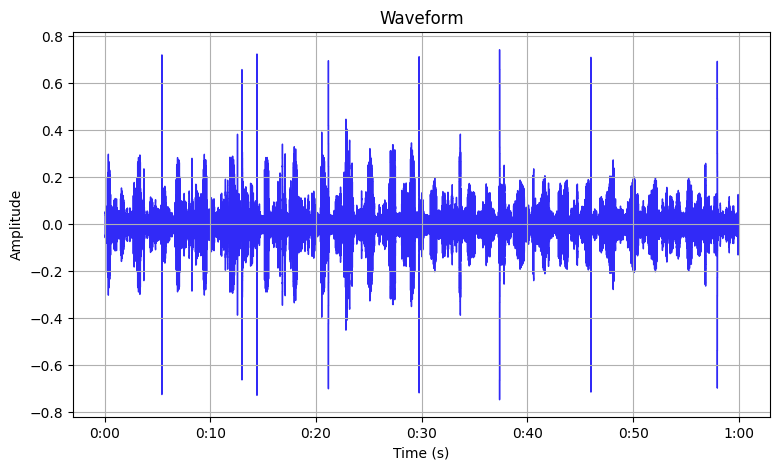

In [9]:
plt.figure(figsize=(9, 5))
librosa.display.waveshow(example_audio_data, sr=sr, color='#312af7')
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

Shape of D object: (1025, 5626)


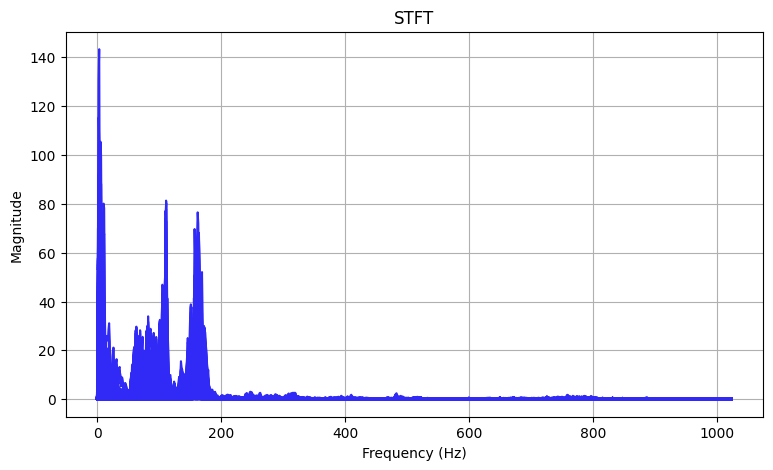

In [7]:
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(example_audio_data, n_fft = n_fft, hop_length = hop_length))

print('Shape of D object:', np.shape(D))

log_scale = False  # Change this to False for linear scale
plt.figure(figsize=(9, 5))
plt.plot(D, color='#312af7')
plt.title('STFT')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
if log_scale:
    plt.yscale('log')
plt.grid(True)
plt.show()

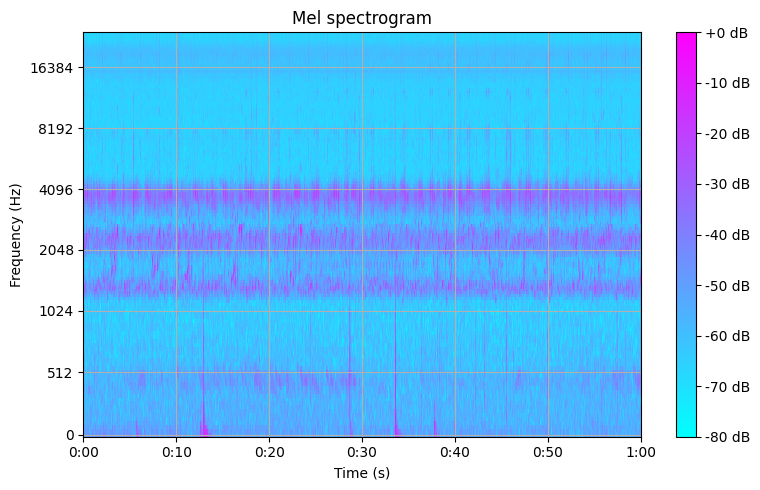

In [8]:
n_mels=128

S = librosa.feature.melspectrogram(y=example_audio_data, sr=sr, n_mels=n_mels)
log_S = librosa.power_to_db(S, ref=np.max)

# Display the Mel spectrogram
plt.figure(figsize=(8, 5))
img = librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel', cmap='cool')
plt.title('Mel spectrogram')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar(img, format='%+02.0f dB')
plt.grid(True)
plt.tight_layout()
plt.show()

In [6]:
data = pd.read_csv(r'rfcx-species-audio-detection\train_tp.csv')
data.head()

,recording_id,species_id,songtype_id,t_min,f_min,t_max,f_max
0,003bec244,14,1,44.5440,2531.250,45.1307,5531.25
1,006ab765f,23,1,39.9615,7235.160,46.0452,11283.40
2,007f87ba2,12,1,39.1360,562.500,42.2720,3281.25
3,0099c367b,17,4,51.4206,1464.260,55.1996,4565.04
4,009b760e6,10,1,50.0854,947.461,52.5293,10852.70


In [11]:
species_freq = data['species_id'].value_counts()
songtype_freq = data['songtype_id'].value_counts()

print("Frequency of all values in 'species_id':")
print(species_freq)

print("\nFrequency of all values in 'songtype_id':")
print(songtype_freq)

Frequency of all values in 'species_id':
species_id
23    100
17     68
14     50
6      50
21     50
4      50
3      50
16     50
13     50
7      50
11     50
1      50
15     50
18     50
0      50
8      50
10     50
12     50
5      50
22     44
19     43
20     40
2      37
9      34
Name: count, dtype: int64

Frequency of all values in 'songtype_id':
songtype_id
1    1088
4     128
Name: count, dtype: int64


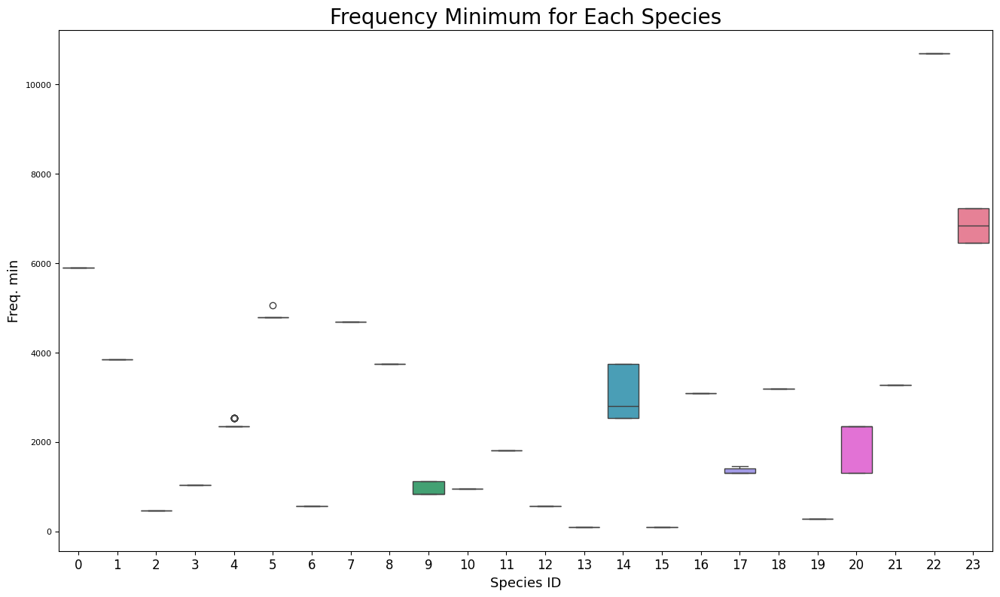

In [11]:
f, ax = plt.subplots(figsize=(16, 9))
sns.boxplot(x="species_id", y="f_min", hue="species_id", data=data, palette='husl', legend=False)

plt.title('Frequency Minimum for Each Species', fontsize = 20)
plt.xticks(fontsize=12)
plt.yticks(fontsize=8)
plt.xlabel("Species ID", fontsize=13)
plt.ylabel("Freq. min", fontsize=13)
plt.gcf().set_size_inches(16, 9)

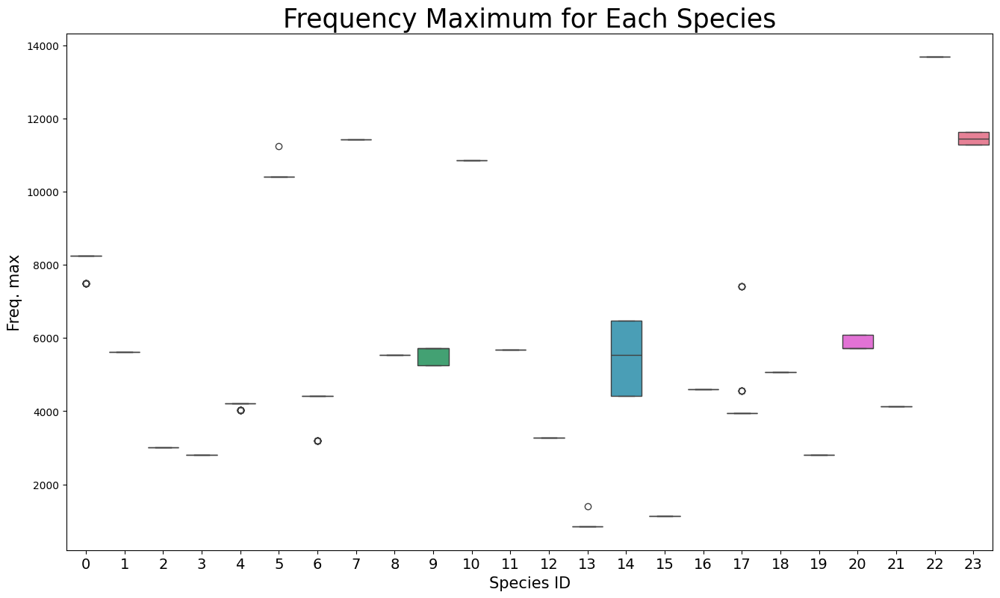

In [12]:
f, ax = plt.subplots(figsize=(16, 9))
sns.boxplot(x="species_id", y="f_max", hue="species_id", data=data, palette='husl', legend=False)

plt.title('Frequency Maximum for Each Species', fontsize = 25)
plt.xticks(fontsize=14)
plt.yticks(fontsize=10)
plt.xlabel("Species ID", fontsize=15)
plt.ylabel("Freq. max", fontsize=15)
plt.gcf().set_size_inches(16, 9)

In [13]:
Audio(example_audio_data, rate=sr)

In [7]:
info = pd.read_csv(r'rfcx-species-audio-detection\train_tp.csv')

example_audio_info = data.iloc[0]
print(example_audio_data)

[-0.02481079 -0.02282715 -0.01690674 ... -0.02301025 -0.01324463
 -0.01937866]


In [15]:
info = pd.read_csv(r'rfcx-species-audio-detection\train_tp.csv')
example_audio_info = data.iloc[0]

def trim_audio(audio, sr, start_time, end_time):
    # Convert time to samples
    start_sample = int(start_time * sr)
    end_sample = int(end_time * sr)
    # Trim
    trimmed_audio = audio[start_sample:end_sample]
    return trimmed_audio

t_min = example_audio_info['t_min']
t_max = example_audio_info['t_max']
trimmed_audio = trim_audio(example_audio_data, sr, t_min, t_max)

Audio(trimmed_audio, rate=sr)

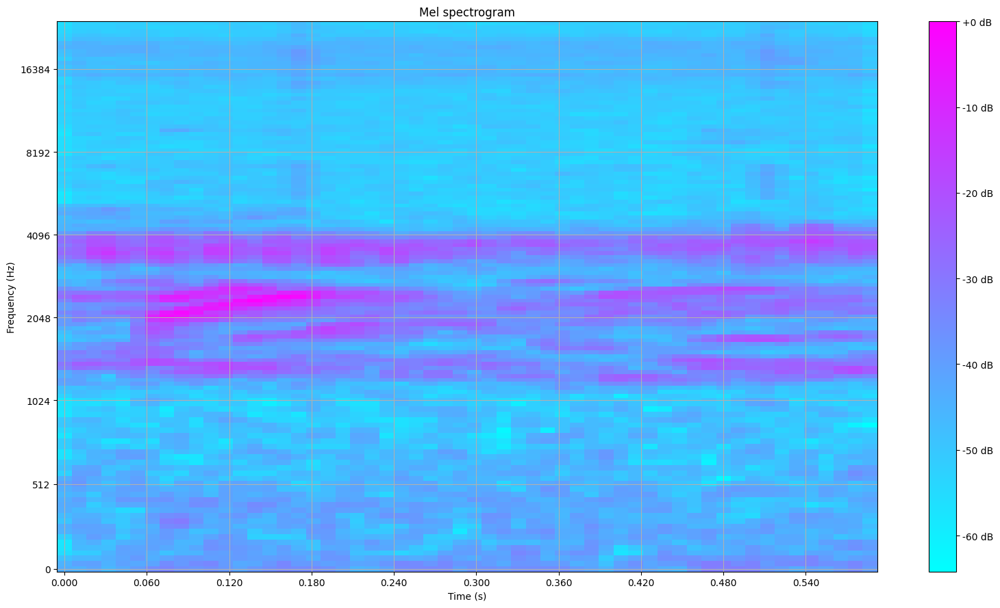

In [16]:
y = trimmed_audio
n_mels=128

S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels)
log_S = librosa.power_to_db(S, ref=np.max)

# Display the Mel spectrogram
plt.figure(figsize=(16, 9))
img = librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel', cmap='cool')
plt.title('Mel spectrogram')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar(img, format='%+02.0f dB')
plt.grid(True)
plt.tight_layout()
plt.show()

#### Batch flac to trimmed wav (train)

In [18]:
# batch flac to trimmed wav
info = pd.read_csv(r'rfcx-species-audio-detection\train_tp.csv')
src_dir = r'rfcx-species-audio-detection\train'
target_dir = r'rfcx-species-audio-detection\trimmed\train'
sr = 48000

files = os.listdir(src_dir)
for file_name in tqdm(files, desc=f'Processing files in directory {src_dir}'):
    if file_name.endswith('.flac'):  # make sure we're processing .flac files
        src_file_path = os.path.join(src_dir, file_name)
        target_file_path = os.path.join(target_dir, file_name.replace('.flac', '.wav'))
        os.makedirs(os.path.dirname(target_file_path), exist_ok=True)  # create target directory if it doesn't exist
        y, _ = librosa.load(src_file_path, sr=sr)
        # Trim
        file_name = file_name.replace('.flac', '')
        if file_name in info['recording_id'].values:
            t_min = info.loc[info['recording_id'] == file_name, 't_min'].values[0]
            t_max = info.loc[info['recording_id'] == file_name, 't_max'].values[0]
            start_sample = int(t_min * sr)
            end_sample = int(t_max * sr)
            y = y[start_sample:end_sample]
            # Save trimmed audio
            sf.write(target_file_path, y, sr)  # write out as .wav
        # there will be missing data as we are only converting the train dataset
        # else: 
        #     print(f'No matching recording_id found for file: {file_name}')


Processing files in directory rfcx-species-audio-detection\train:   0%|          | 0/4727 [00:00<?, ?it/s]

#### Batch trimmed wav to mel spectogram

In [ ]:
info = pd.read_csv(r'rfcx-species-audio-detection\train_tp.csv')
src_dir = r'rfcx-species-audio-detection\trimmed\train'
target_dir = r'rfcx-species-audio-detection\trimmed_mel\train'
sr = 48000

# Define parameters
n_mels = 128

files = os.listdir(src_dir)
for file_name in tqdm(files, desc=f'Processing files in directory {src_dir}'):
    if file_name.endswith('.wav'):  # make sure we're processing .wav files
        src_file_path = os.path.join(src_dir, file_name)
        file_name_without_extension = file_name.replace('.wav', '')
        species_id = info.loc[info['recording_id'] == file_name_without_extension, 'species_id'].values[0]
        target_subdir = os.path.join(target_dir, str(species_id))
        target_file_path = os.path.join(target_subdir, file_name.replace('.wav', '.png'))
        os.makedirs(os.path.dirname(target_file_path), exist_ok=True)  # create target directory if it doesn't exist
        # Convert audio to a Mel spectrogram
        y, sr = librosa.load(src_file_path, sr=sr)
        S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels)
        log_S = librosa.power_to_db(S, ref=np.max)
        # Normalize to [0, 255] and convert to uint8
        img = ((log_S - log_S.min()) / (log_S.max() - log_S.min()) * 255).astype(np.uint8)
        # Save the Mel spectrogram as a PNG image
        imageio.imwrite(target_file_path, img)

Processing files in directory rfcx-species-audio-detection\trimmed\train:   0%|          | 0/1132 [00:00<?, ?i…

#### Batch trimmed wav to trimmed wav with band pass filter

In [28]:
# Define the source and target directories
info = pd.read_csv(r'rfcx-species-audio-detection\train_tp.csv')
src_dir = r'rfcx-species-audio-detection\trimmed\train'
target_dir = r'rfcx-species-audio-detection\trimmed_bandpass_mel\train'
sr = 48000

# Define parameters
n_mels = 128

files = os.listdir(src_dir)
for file_name in tqdm(files, desc=f'Processing files in directory {src_dir}'):
    if file_name.endswith('.wav'):  # make sure we're processing .wav files
        src_file_path = os.path.join(src_dir, file_name)
        file_name_without_extension = file_name.replace('.wav', '')
        species_id = info.loc[info['recording_id'] == file_name_without_extension, 'species_id'].values[0]
        target_subdir = os.path.join(target_dir, str(species_id))
        target_file_path = os.path.join(target_subdir, file_name)
        os.makedirs(os.path.dirname(target_file_path), exist_ok=True)  # create target directory if it doesn't exist
        # Load audio
        y, _ = librosa.load(src_file_path, sr=sr)
        # apply bandpass filter
        if file_name_without_extension in info['recording_id'].values:
            f_min = info.loc[info['recording_id'] == file_name_without_extension, 'f_min'].values[0]
            f_max = info.loc[info['recording_id'] == file_name_without_extension, 'f_max'].values[0]
            sos = scipy.signal.butter(10, [f_min, f_max], btype='band', output='sos', fs=sr)
            y = scipy.signal.sosfilt(sos, y)
        # Save trimmed audio
        sf.write(target_file_path, y, sr)  # write out as .wav


Processing files in directory rfcx-species-audio-detection\trimmed\train:   0%|          | 0/1132 [00:00<?, ?i…

In [17]:
# Read the wav file
sample_rate, data = wavfile.read(r'rfcx-species-audio-detection\trimmed\train\0a9cdd8a5.wav')

# Compute FFT
fft_out = np.fft.rfft(data)

# Compute absolute value of FFT output to get magnitude
abs_fft_out = np.abs(fft_out)

# Compute frequencies associated with FFT output
freqs = np.fft.rfftfreq(len(data), 1/sample_rate)

# Find the lowest and highest frequencies
lowest_freq = freqs[np.argmin(abs_fft_out)]
highest_freq = freqs[np.argmax(abs_fft_out)]

print(f'Lowest frequency: {lowest_freq} Hz')
print(f'Highest frequency: {highest_freq} Hz')

# Read the wav file
sample_rate, data = wavfile.read(r'rfcx-species-audio-detection\trimmed_bandpass_mel\train\0\00d442df7.wav')

# Compute FFT
fft_out = np.fft.rfft(data)

# Compute absolute value of FFT output to get magnitude
abs_fft_out = np.abs(fft_out)

# Compute frequencies associated with FFT output
freqs = np.fft.rfftfreq(len(data), 1/sample_rate)

# Find the lowest and highest frequencies
lowest_freq = freqs[np.argmin(abs_fft_out)]
highest_freq = freqs[np.argmax(abs_fft_out)]

print(f'Lowest frequency: {lowest_freq} Hz')
print(f'Highest frequency: {highest_freq} Hz')

Lowest frequency: 3040.767195240843 Hz
Highest frequency: 8157.736614870378 Hz
Lowest frequency: 17351.01976616159 Hz
Highest frequency: 7244.167147276254 Hz


#### Model

In [4]:
# Load the pretrained model
model = models.resnet18(weights='ResNet18_Weights.IMAGENET1K_V1')

# If you want to do finetuning then set requires_grad = False
# This will freeze the weights for all layers
for param in model.parameters():
    param.requires_grad = False

model.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)

# Add an adaptive average pooling layer to allow for a dynamic input
model.avgpool = nn.AdaptiveAvgPool2d((1, 1))

# Replace the last layer for 24 classes
num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Linear(num_ftrs, 24),
    nn.Sigmoid()
)

#### Define parameters

In [15]:
batch_size = 16
num_epochs = 250
image_size = (194, 194)
learning_rate = 0.001
use_scheduler = True

display_graphs_bool = True
acc_min_y = 0.2
loss_max_y = 4
loss_min_y = 2
major_tick_spacing = 20
display_graphs_zoomed_bool = False
interval = 50
debug = False

In [16]:
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

In [17]:
if use_scheduler:
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.90)

#### Preprocess Data

In [18]:
data_dir = r'rfcx-species-audio-detection\trimmed_mel\train'

transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.Grayscale(),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.clamp(0, 1))
])

# Load the data
full_dataset = ImageFolder(data_dir, transform=transform)

# Split the data into training and test sets
train_size = int(0.8 * len(full_dataset))  # 80% for training
test_size = len(full_dataset) - train_size  # 20% for testing
train_dataset, test_dataset = random_split(full_dataset, [train_size, test_size])

# Dataloaders
batch_size = 16
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, drop_last=True)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

print(len(test_dataset))
print(len(train_dataset))


print(f"Moving model to device...")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Check if GPU is available
print(f"Device count: {device}")
model.to(device)  # Move the model to the device (CPU or GPU)
print("Complete")

print("Setting up model...")
model.train()  # Set the model to training mode

loss_function = nn.CrossEntropyLoss()  # Define the loss function
model.zero_grad()  # Reset gradients tensors
optimizer.zero_grad()  # Reset optimizer gradients
print("Complete")

total_steps = len(train_loader)  # Total number of steps in an epoch

227
905
Moving model to device...
Device count: cuda
Complete
Setting up model...
Complete


In [19]:
checkpoint_dir = "ModelSaves\ResNet18\M2"
model_name = "M2"
os.makedirs(checkpoint_dir, exist_ok=True)

def save_checkpoint(epoch, model, optimizer, loss, val_loss, accuracy, val_accuracy):
    checkpoint_path = os.path.join(checkpoint_dir, f'{model_name}_epoch_{epoch+1}_loss_{loss:.4f}_vloss{val_loss:.4f}_acc_{accuracy:.4f}_vacc{val_accuracy:.4f}.pt')
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss
    }
    torch.save(checkpoint, checkpoint_path)

def save_model(epoch, model, optimizer, loss, val_loss, accuracy, val_accuracy):
    path = os.path.join(checkpoint_dir, f'{model_name}_epoch_{epoch+1}_loss_{loss:.4f}_vloss{val_loss:.4f}_acc_{accuracy:.4f}_vacc{val_accuracy:.4f}.pt')
    torch.save(model, path)

Beginning training...


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [1/250], Loss: 3.0720, Acc: 0.0714, Val Loss: 3.1467, Val Acc: 0.0759


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [2/250], Loss: 3.0320, Acc: 0.1808, Val Loss: 3.0453, Val Acc: 0.1295


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [3/250], Loss: 2.9190, Acc: 0.3672, Val Loss: 2.9693, Val Acc: 0.2321


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [4/250], Loss: 2.8570, Acc: 0.4464, Val Loss: 2.8502, Val Acc: 0.3304


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [5/250], Loss: 2.8885, Acc: 0.5368, Val Loss: 2.8781, Val Acc: 0.2991


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [6/250], Loss: 2.8629, Acc: 0.6161, Val Loss: 2.8045, Val Acc: 0.3080


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [7/250], Loss: 2.8663, Acc: 0.6429, Val Loss: 2.8114, Val Acc: 0.2411


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [8/250], Loss: 2.8668, Acc: 0.6741, Val Loss: 2.8823, Val Acc: 0.2991


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [9/250], Loss: 2.7639, Acc: 0.7176, Val Loss: 2.7624, Val Acc: 0.3750


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [10/250], Loss: 2.7658, Acc: 0.7143, Val Loss: 2.8015, Val Acc: 0.3705


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [11/250], Loss: 2.6994, Acc: 0.7578, Val Loss: 2.7101, Val Acc: 0.4598


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [12/250], Loss: 2.6632, Acc: 0.7612, Val Loss: 2.6618, Val Acc: 0.5134


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [13/250], Loss: 2.9578, Acc: 0.7857, Val Loss: 2.9307, Val Acc: 0.2277


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [14/250], Loss: 2.6444, Acc: 0.7768, Val Loss: 2.6853, Val Acc: 0.4286


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [15/250], Loss: 2.7668, Acc: 0.7824, Val Loss: 2.7449, Val Acc: 0.4866


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [16/250], Loss: 2.5469, Acc: 0.8125, Val Loss: 2.6102, Val Acc: 0.5625


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [17/250], Loss: 2.6043, Acc: 0.8304, Val Loss: 2.6454, Val Acc: 0.5848


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [18/250], Loss: 2.7926, Acc: 0.8237, Val Loss: 2.8235, Val Acc: 0.4152


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [19/250], Loss: 2.6778, Acc: 0.8516, Val Loss: 2.6976, Val Acc: 0.4911


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [20/250], Loss: 2.8493, Acc: 0.8438, Val Loss: 2.8620, Val Acc: 0.3259


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [21/250], Loss: 2.7048, Acc: 0.8337, Val Loss: 2.7524, Val Acc: 0.4911


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [22/250], Loss: 2.6324, Acc: 0.8538, Val Loss: 2.6108, Val Acc: 0.5491


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [23/250], Loss: 2.5681, Acc: 0.8605, Val Loss: 2.5822, Val Acc: 0.5759


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [24/250], Loss: 2.6615, Acc: 0.8839, Val Loss: 2.6527, Val Acc: 0.4777


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [25/250], Loss: 2.7418, Acc: 0.8873, Val Loss: 2.8066, Val Acc: 0.4286


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [26/250], Loss: 2.6715, Acc: 0.8828, Val Loss: 2.7198, Val Acc: 0.4955


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [27/250], Loss: 2.6019, Acc: 0.8739, Val Loss: 2.6091, Val Acc: 0.5670


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [28/250], Loss: 2.6702, Acc: 0.8850, Val Loss: 2.7512, Val Acc: 0.4509


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [29/250], Loss: 2.6504, Acc: 0.8917, Val Loss: 2.5690, Val Acc: 0.6161


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [30/250], Loss: 2.6378, Acc: 0.8940, Val Loss: 2.6260, Val Acc: 0.5402


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [31/250], Loss: 2.5874, Acc: 0.8850, Val Loss: 2.6352, Val Acc: 0.5089


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [32/250], Loss: 2.5810, Acc: 0.8895, Val Loss: 2.6624, Val Acc: 0.5491


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [33/250], Loss: 2.5767, Acc: 0.8973, Val Loss: 2.6424, Val Acc: 0.5402


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [34/250], Loss: 2.5607, Acc: 0.9107, Val Loss: 2.5779, Val Acc: 0.5804


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [35/250], Loss: 2.6978, Acc: 0.9241, Val Loss: 2.7215, Val Acc: 0.4732


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [36/250], Loss: 2.6240, Acc: 0.9219, Val Loss: 2.6442, Val Acc: 0.5446


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [37/250], Loss: 2.7823, Acc: 0.9040, Val Loss: 2.7808, Val Acc: 0.4509


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [38/250], Loss: 2.5981, Acc: 0.9252, Val Loss: 2.5901, Val Acc: 0.5491


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [39/250], Loss: 2.5466, Acc: 0.9051, Val Loss: 2.5820, Val Acc: 0.6384


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [40/250], Loss: 2.6049, Acc: 0.9029, Val Loss: 2.6301, Val Acc: 0.5893


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [41/250], Loss: 2.5711, Acc: 0.9074, Val Loss: 2.6447, Val Acc: 0.5804


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [42/250], Loss: 2.6107, Acc: 0.9275, Val Loss: 2.6693, Val Acc: 0.5402


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [43/250], Loss: 2.6928, Acc: 0.9208, Val Loss: 2.7155, Val Acc: 0.5000


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [44/250], Loss: 2.7345, Acc: 0.9163, Val Loss: 2.7174, Val Acc: 0.4821


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [45/250], Loss: 2.6278, Acc: 0.9386, Val Loss: 2.5757, Val Acc: 0.6339


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [46/250], Loss: 2.7335, Acc: 0.9353, Val Loss: 2.7318, Val Acc: 0.4464


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [47/250], Loss: 2.5381, Acc: 0.9208, Val Loss: 2.5853, Val Acc: 0.5982


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [48/250], Loss: 2.7990, Acc: 0.9364, Val Loss: 2.7123, Val Acc: 0.4509


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [49/250], Loss: 2.5258, Acc: 0.9342, Val Loss: 2.5897, Val Acc: 0.6027


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [50/250], Loss: 2.6572, Acc: 0.9475, Val Loss: 2.6967, Val Acc: 0.5312


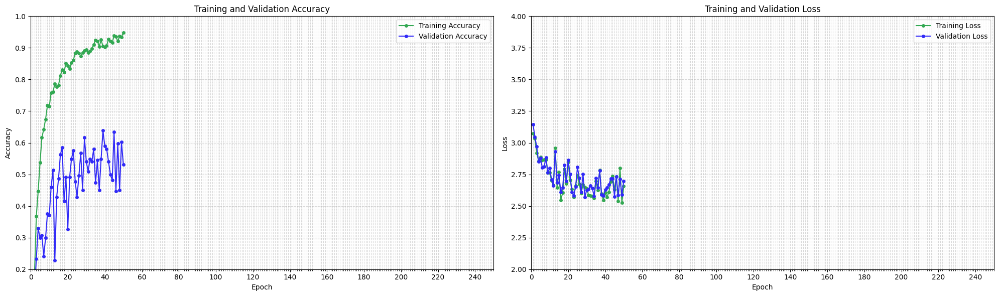

  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [51/250], Loss: 2.5824, Acc: 0.9420, Val Loss: 2.5697, Val Acc: 0.6071


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [52/250], Loss: 2.5415, Acc: 0.9353, Val Loss: 2.5692, Val Acc: 0.6027


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [53/250], Loss: 2.5064, Acc: 0.9542, Val Loss: 2.5576, Val Acc: 0.6250


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [54/250], Loss: 2.4747, Acc: 0.9342, Val Loss: 2.5399, Val Acc: 0.6384


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [55/250], Loss: 2.7428, Acc: 0.9408, Val Loss: 2.7486, Val Acc: 0.4062


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [56/250], Loss: 2.5501, Acc: 0.9509, Val Loss: 2.5880, Val Acc: 0.6116


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [57/250], Loss: 2.6223, Acc: 0.9408, Val Loss: 2.6755, Val Acc: 0.5714


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [58/250], Loss: 2.6020, Acc: 0.9442, Val Loss: 2.6560, Val Acc: 0.5714


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [59/250], Loss: 2.5232, Acc: 0.9408, Val Loss: 2.6049, Val Acc: 0.5759


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [60/250], Loss: 2.6888, Acc: 0.9565, Val Loss: 2.6582, Val Acc: 0.5536


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [61/250], Loss: 2.6038, Acc: 0.9431, Val Loss: 2.6470, Val Acc: 0.5268


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [62/250], Loss: 2.5700, Acc: 0.9442, Val Loss: 2.5915, Val Acc: 0.6116


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [63/250], Loss: 2.6791, Acc: 0.9475, Val Loss: 2.6665, Val Acc: 0.5134


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [64/250], Loss: 2.5893, Acc: 0.9498, Val Loss: 2.6204, Val Acc: 0.5670


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [65/250], Loss: 2.5219, Acc: 0.9453, Val Loss: 2.5592, Val Acc: 0.6250


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [66/250], Loss: 2.7447, Acc: 0.9431, Val Loss: 2.6610, Val Acc: 0.5000


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [67/250], Loss: 2.5300, Acc: 0.9498, Val Loss: 2.6301, Val Acc: 0.5938


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [68/250], Loss: 2.5905, Acc: 0.9509, Val Loss: 2.6600, Val Acc: 0.5446


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [69/250], Loss: 2.7469, Acc: 0.9464, Val Loss: 2.7765, Val Acc: 0.4509


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [70/250], Loss: 2.6577, Acc: 0.9676, Val Loss: 2.6345, Val Acc: 0.6161


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [71/250], Loss: 2.5425, Acc: 0.9576, Val Loss: 2.5877, Val Acc: 0.6830


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [72/250], Loss: 2.6400, Acc: 0.9654, Val Loss: 2.6679, Val Acc: 0.5536


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [73/250], Loss: 2.5879, Acc: 0.9576, Val Loss: 2.5709, Val Acc: 0.6295


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [74/250], Loss: 2.6616, Acc: 0.9420, Val Loss: 2.6868, Val Acc: 0.4777


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [75/250], Loss: 2.6208, Acc: 0.9654, Val Loss: 2.7056, Val Acc: 0.5670


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [76/250], Loss: 2.5835, Acc: 0.9643, Val Loss: 2.6383, Val Acc: 0.5714


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [77/250], Loss: 2.6673, Acc: 0.9587, Val Loss: 2.6648, Val Acc: 0.5670


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [78/250], Loss: 2.6320, Acc: 0.9699, Val Loss: 2.6627, Val Acc: 0.5402


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [79/250], Loss: 2.5316, Acc: 0.9699, Val Loss: 2.6753, Val Acc: 0.5670


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [80/250], Loss: 2.6323, Acc: 0.9621, Val Loss: 2.7495, Val Acc: 0.4598


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [81/250], Loss: 2.7115, Acc: 0.9542, Val Loss: 2.7576, Val Acc: 0.4509


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [82/250], Loss: 2.7320, Acc: 0.9632, Val Loss: 2.6855, Val Acc: 0.4777


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [83/250], Loss: 2.5033, Acc: 0.9598, Val Loss: 2.5825, Val Acc: 0.5982


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [84/250], Loss: 2.6174, Acc: 0.9609, Val Loss: 2.6825, Val Acc: 0.5536


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [85/250], Loss: 2.5793, Acc: 0.9676, Val Loss: 2.6164, Val Acc: 0.6295


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [86/250], Loss: 2.5782, Acc: 0.9621, Val Loss: 2.6287, Val Acc: 0.6071


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [87/250], Loss: 2.6028, Acc: 0.9475, Val Loss: 2.6109, Val Acc: 0.6339


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [88/250], Loss: 2.5222, Acc: 0.9721, Val Loss: 2.5739, Val Acc: 0.6384


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [89/250], Loss: 2.6325, Acc: 0.9587, Val Loss: 2.6433, Val Acc: 0.5938


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [90/250], Loss: 2.6727, Acc: 0.9587, Val Loss: 2.6485, Val Acc: 0.6027


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [91/250], Loss: 2.5751, Acc: 0.9643, Val Loss: 2.6823, Val Acc: 0.5982


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [92/250], Loss: 2.6886, Acc: 0.9621, Val Loss: 2.7420, Val Acc: 0.5223


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [93/250], Loss: 2.5984, Acc: 0.9609, Val Loss: 2.6416, Val Acc: 0.5759


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [94/250], Loss: 2.5102, Acc: 0.9665, Val Loss: 2.5552, Val Acc: 0.6384


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [95/250], Loss: 2.6721, Acc: 0.9743, Val Loss: 2.7190, Val Acc: 0.5223


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [96/250], Loss: 2.5961, Acc: 0.9676, Val Loss: 2.6334, Val Acc: 0.5759


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [97/250], Loss: 2.6468, Acc: 0.9554, Val Loss: 2.7391, Val Acc: 0.4955


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [98/250], Loss: 2.5273, Acc: 0.9665, Val Loss: 2.6652, Val Acc: 0.5134


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [99/250], Loss: 2.6071, Acc: 0.9710, Val Loss: 2.5982, Val Acc: 0.6473


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [100/250], Loss: 2.5174, Acc: 0.9621, Val Loss: 2.5809, Val Acc: 0.6652


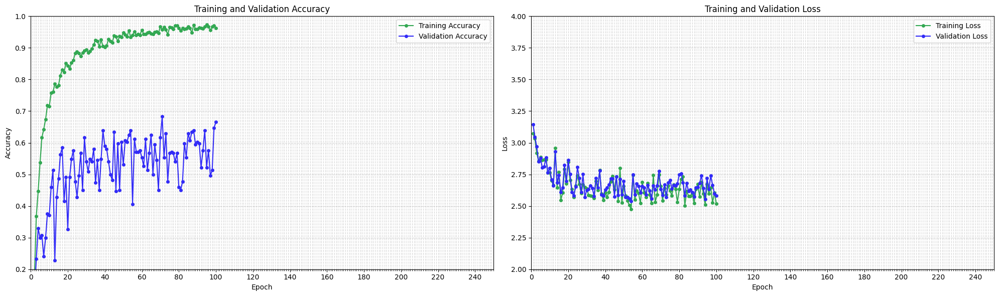

  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [101/250], Loss: 2.5096, Acc: 0.9688, Val Loss: 2.5989, Val Acc: 0.6518


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [102/250], Loss: 2.6510, Acc: 0.9688, Val Loss: 2.6727, Val Acc: 0.5670


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [103/250], Loss: 2.5245, Acc: 0.9743, Val Loss: 2.5972, Val Acc: 0.6295


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [104/250], Loss: 2.6311, Acc: 0.9665, Val Loss: 2.6809, Val Acc: 0.5714


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [105/250], Loss: 2.5613, Acc: 0.9710, Val Loss: 2.6211, Val Acc: 0.6116


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [106/250], Loss: 2.6503, Acc: 0.9576, Val Loss: 2.6979, Val Acc: 0.5312


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [107/250], Loss: 2.5821, Acc: 0.9732, Val Loss: 2.6191, Val Acc: 0.6384


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [108/250], Loss: 2.5999, Acc: 0.9743, Val Loss: 2.5921, Val Acc: 0.6161


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [109/250], Loss: 2.5687, Acc: 0.9766, Val Loss: 2.5868, Val Acc: 0.6339


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [110/250], Loss: 2.5482, Acc: 0.9732, Val Loss: 2.5959, Val Acc: 0.6429


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [111/250], Loss: 2.7594, Acc: 0.9710, Val Loss: 2.7248, Val Acc: 0.4821


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [112/250], Loss: 2.5249, Acc: 0.9754, Val Loss: 2.6553, Val Acc: 0.5714


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [113/250], Loss: 2.7764, Acc: 0.9754, Val Loss: 2.8392, Val Acc: 0.3705


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [114/250], Loss: 2.5246, Acc: 0.9721, Val Loss: 2.5977, Val Acc: 0.6696


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [115/250], Loss: 2.6757, Acc: 0.9710, Val Loss: 2.6731, Val Acc: 0.5625


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [116/250], Loss: 2.6012, Acc: 0.9754, Val Loss: 2.6381, Val Acc: 0.5893


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [117/250], Loss: 2.5629, Acc: 0.9688, Val Loss: 2.5597, Val Acc: 0.6518


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [118/250], Loss: 2.5128, Acc: 0.9788, Val Loss: 2.5654, Val Acc: 0.6384


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [119/250], Loss: 2.5305, Acc: 0.9732, Val Loss: 2.6084, Val Acc: 0.6339


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [120/250], Loss: 2.5275, Acc: 0.9766, Val Loss: 2.5725, Val Acc: 0.5938


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [121/250], Loss: 2.6219, Acc: 0.9810, Val Loss: 2.6511, Val Acc: 0.5893


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [122/250], Loss: 2.6162, Acc: 0.9699, Val Loss: 2.6255, Val Acc: 0.6027


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [123/250], Loss: 2.5230, Acc: 0.9754, Val Loss: 2.5951, Val Acc: 0.6161


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [124/250], Loss: 2.5223, Acc: 0.9788, Val Loss: 2.6177, Val Acc: 0.5938


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [125/250], Loss: 2.4994, Acc: 0.9743, Val Loss: 2.5878, Val Acc: 0.6339


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [126/250], Loss: 2.4855, Acc: 0.9810, Val Loss: 2.5657, Val Acc: 0.6429


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [127/250], Loss: 2.4873, Acc: 0.9810, Val Loss: 2.6066, Val Acc: 0.6562


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [128/250], Loss: 2.5610, Acc: 0.9788, Val Loss: 2.6369, Val Acc: 0.5670


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [129/250], Loss: 2.5054, Acc: 0.9788, Val Loss: 2.5490, Val Acc: 0.6786


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [130/250], Loss: 2.5290, Acc: 0.9788, Val Loss: 2.6084, Val Acc: 0.5982


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [131/250], Loss: 2.7021, Acc: 0.9710, Val Loss: 2.6725, Val Acc: 0.5491


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [132/250], Loss: 2.6647, Acc: 0.9788, Val Loss: 2.7136, Val Acc: 0.5402


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [133/250], Loss: 2.5527, Acc: 0.9676, Val Loss: 2.6470, Val Acc: 0.6429


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [134/250], Loss: 2.5337, Acc: 0.9788, Val Loss: 2.5780, Val Acc: 0.6295


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [135/250], Loss: 2.5095, Acc: 0.9810, Val Loss: 2.6479, Val Acc: 0.5938


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [136/250], Loss: 2.5332, Acc: 0.9799, Val Loss: 2.6053, Val Acc: 0.6384


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [137/250], Loss: 2.4960, Acc: 0.9777, Val Loss: 2.5886, Val Acc: 0.6384


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [138/250], Loss: 2.5479, Acc: 0.9754, Val Loss: 2.6204, Val Acc: 0.6071


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [139/250], Loss: 2.6909, Acc: 0.9766, Val Loss: 2.8035, Val Acc: 0.4107


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [140/250], Loss: 2.5829, Acc: 0.9799, Val Loss: 2.6002, Val Acc: 0.5982


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [141/250], Loss: 2.7015, Acc: 0.9676, Val Loss: 2.7212, Val Acc: 0.5045


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [142/250], Loss: 2.6639, Acc: 0.9754, Val Loss: 2.6949, Val Acc: 0.5179


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [143/250], Loss: 2.5602, Acc: 0.9621, Val Loss: 2.6567, Val Acc: 0.5670


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [144/250], Loss: 2.5614, Acc: 0.9732, Val Loss: 2.5548, Val Acc: 0.6384


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [145/250], Loss: 2.5027, Acc: 0.9799, Val Loss: 2.6085, Val Acc: 0.6027


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [146/250], Loss: 2.5396, Acc: 0.9743, Val Loss: 2.5815, Val Acc: 0.6696


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [147/250], Loss: 2.6421, Acc: 0.9777, Val Loss: 2.6163, Val Acc: 0.6071


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [148/250], Loss: 2.6763, Acc: 0.9855, Val Loss: 2.6922, Val Acc: 0.5357


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [149/250], Loss: 2.5858, Acc: 0.9732, Val Loss: 2.6245, Val Acc: 0.5714


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [150/250], Loss: 2.5135, Acc: 0.9754, Val Loss: 2.6713, Val Acc: 0.5670


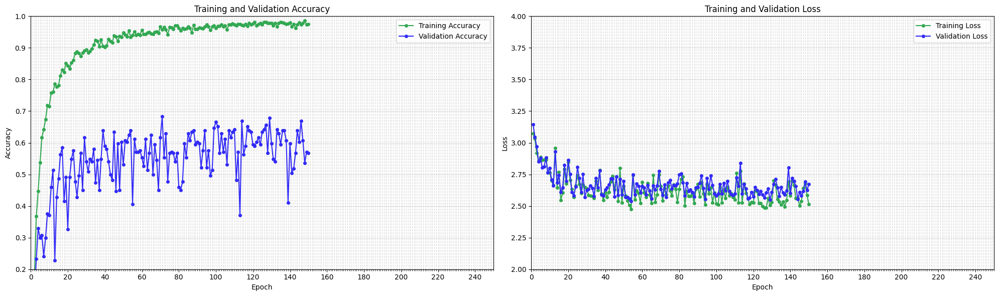

  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [151/250], Loss: 2.4583, Acc: 0.9766, Val Loss: 2.5705, Val Acc: 0.6473


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [152/250], Loss: 2.6614, Acc: 0.9799, Val Loss: 2.6342, Val Acc: 0.5804


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [153/250], Loss: 2.6773, Acc: 0.9676, Val Loss: 2.7019, Val Acc: 0.5134


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [154/250], Loss: 2.5291, Acc: 0.9821, Val Loss: 2.6206, Val Acc: 0.6161


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [155/250], Loss: 2.4488, Acc: 0.9777, Val Loss: 2.5732, Val Acc: 0.6518


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [156/250], Loss: 2.6588, Acc: 0.9799, Val Loss: 2.7229, Val Acc: 0.5223


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [157/250], Loss: 2.5137, Acc: 0.9766, Val Loss: 2.5755, Val Acc: 0.6295


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [158/250], Loss: 2.5072, Acc: 0.9833, Val Loss: 2.6619, Val Acc: 0.5491


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [159/250], Loss: 2.5988, Acc: 0.9810, Val Loss: 2.6135, Val Acc: 0.6429


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [160/250], Loss: 2.5200, Acc: 0.9821, Val Loss: 2.6041, Val Acc: 0.5670


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [161/250], Loss: 2.5252, Acc: 0.9833, Val Loss: 2.5974, Val Acc: 0.6071


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [162/250], Loss: 2.5603, Acc: 0.9766, Val Loss: 2.6653, Val Acc: 0.5625


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [163/250], Loss: 2.5546, Acc: 0.9777, Val Loss: 2.6362, Val Acc: 0.6295


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [164/250], Loss: 2.5575, Acc: 0.9833, Val Loss: 2.5390, Val Acc: 0.6652


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [165/250], Loss: 2.8667, Acc: 0.9810, Val Loss: 2.8496, Val Acc: 0.3795


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [166/250], Loss: 2.6408, Acc: 0.9810, Val Loss: 2.5916, Val Acc: 0.6518


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [167/250], Loss: 2.4692, Acc: 0.9833, Val Loss: 2.6488, Val Acc: 0.6071


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [168/250], Loss: 2.5621, Acc: 0.9743, Val Loss: 2.5987, Val Acc: 0.6384


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [169/250], Loss: 2.5496, Acc: 0.9810, Val Loss: 2.5583, Val Acc: 0.6652


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [170/250], Loss: 2.5209, Acc: 0.9788, Val Loss: 2.5782, Val Acc: 0.6473


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [171/250], Loss: 2.7171, Acc: 0.9810, Val Loss: 2.6992, Val Acc: 0.5223


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [172/250], Loss: 2.5651, Acc: 0.9866, Val Loss: 2.6052, Val Acc: 0.6116


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [173/250], Loss: 2.6206, Acc: 0.9810, Val Loss: 2.6431, Val Acc: 0.5938


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [174/250], Loss: 2.4203, Acc: 0.9866, Val Loss: 2.6545, Val Acc: 0.5804


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [175/250], Loss: 2.6388, Acc: 0.9833, Val Loss: 2.6392, Val Acc: 0.5491


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [176/250], Loss: 2.4436, Acc: 0.9754, Val Loss: 2.6064, Val Acc: 0.6384


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [177/250], Loss: 2.5034, Acc: 0.9754, Val Loss: 2.6090, Val Acc: 0.5982


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [178/250], Loss: 2.5877, Acc: 0.9855, Val Loss: 2.6634, Val Acc: 0.6161


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [179/250], Loss: 2.7761, Acc: 0.9821, Val Loss: 2.8076, Val Acc: 0.4821


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [180/250], Loss: 2.4964, Acc: 0.9821, Val Loss: 2.6314, Val Acc: 0.5938


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [181/250], Loss: 2.6577, Acc: 0.9788, Val Loss: 2.6654, Val Acc: 0.5312


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [182/250], Loss: 2.9009, Acc: 0.9754, Val Loss: 2.8393, Val Acc: 0.4241


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [183/250], Loss: 2.5646, Acc: 0.9799, Val Loss: 2.5754, Val Acc: 0.6741


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [184/250], Loss: 2.5204, Acc: 0.9877, Val Loss: 2.6408, Val Acc: 0.6339


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [185/250], Loss: 2.5564, Acc: 0.9821, Val Loss: 2.6913, Val Acc: 0.5402


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [186/250], Loss: 2.6921, Acc: 0.9799, Val Loss: 2.8397, Val Acc: 0.4375


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [187/250], Loss: 2.5444, Acc: 0.9799, Val Loss: 2.6146, Val Acc: 0.6161


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [188/250], Loss: 2.6278, Acc: 0.9810, Val Loss: 2.6854, Val Acc: 0.5804


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [189/250], Loss: 2.6592, Acc: 0.9833, Val Loss: 2.6679, Val Acc: 0.5580


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [190/250], Loss: 2.5405, Acc: 0.9844, Val Loss: 2.5839, Val Acc: 0.6295


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [191/250], Loss: 2.5991, Acc: 0.9799, Val Loss: 2.6492, Val Acc: 0.5402


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [192/250], Loss: 2.6632, Acc: 0.9810, Val Loss: 2.6163, Val Acc: 0.5938


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [193/250], Loss: 2.5693, Acc: 0.9810, Val Loss: 2.6295, Val Acc: 0.6027


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [194/250], Loss: 2.4742, Acc: 0.9821, Val Loss: 2.5661, Val Acc: 0.6429


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [195/250], Loss: 2.6550, Acc: 0.9799, Val Loss: 2.7747, Val Acc: 0.4554


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [196/250], Loss: 2.4846, Acc: 0.9821, Val Loss: 2.6095, Val Acc: 0.6518


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [197/250], Loss: 2.5497, Acc: 0.9821, Val Loss: 2.6082, Val Acc: 0.6071


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [198/250], Loss: 2.6489, Acc: 0.9833, Val Loss: 2.7442, Val Acc: 0.5179


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [199/250], Loss: 2.6126, Acc: 0.9754, Val Loss: 2.7048, Val Acc: 0.5491


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [200/250], Loss: 2.5490, Acc: 0.9821, Val Loss: 2.6078, Val Acc: 0.6116


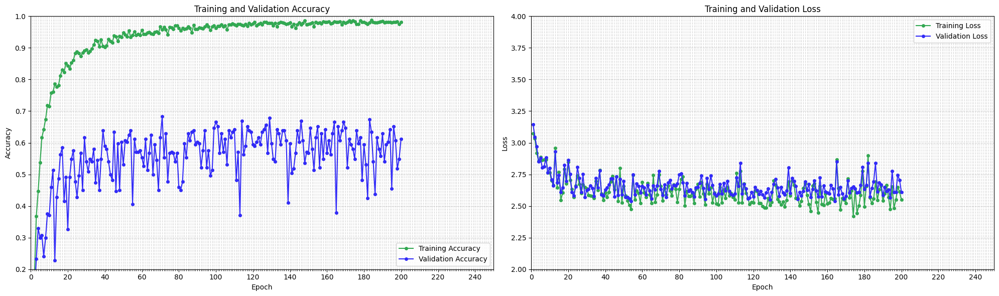

  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [201/250], Loss: 2.5172, Acc: 0.9710, Val Loss: 2.6734, Val Acc: 0.5625


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [202/250], Loss: 2.5551, Acc: 0.9866, Val Loss: 2.5888, Val Acc: 0.6473


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [203/250], Loss: 2.4940, Acc: 0.9844, Val Loss: 2.5932, Val Acc: 0.6205


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [204/250], Loss: 2.6546, Acc: 0.9844, Val Loss: 2.6902, Val Acc: 0.5536


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [205/250], Loss: 2.5492, Acc: 0.9877, Val Loss: 2.6642, Val Acc: 0.5893


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [206/250], Loss: 2.6050, Acc: 0.9877, Val Loss: 2.7371, Val Acc: 0.5446


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [207/250], Loss: 2.5165, Acc: 0.9855, Val Loss: 2.6002, Val Acc: 0.6473


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [208/250], Loss: 2.5712, Acc: 0.9799, Val Loss: 2.6137, Val Acc: 0.6161


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [209/250], Loss: 2.6529, Acc: 0.9833, Val Loss: 2.6184, Val Acc: 0.6027


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [210/250], Loss: 2.5743, Acc: 0.9877, Val Loss: 2.6341, Val Acc: 0.6250


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [211/250], Loss: 2.5646, Acc: 0.9877, Val Loss: 2.6100, Val Acc: 0.6250


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [212/250], Loss: 2.6888, Acc: 0.9821, Val Loss: 2.6506, Val Acc: 0.5714


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [213/250], Loss: 2.5749, Acc: 0.9844, Val Loss: 2.5830, Val Acc: 0.6384


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [214/250], Loss: 2.5158, Acc: 0.9877, Val Loss: 2.5907, Val Acc: 0.6696


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [215/250], Loss: 2.5581, Acc: 0.9799, Val Loss: 2.6236, Val Acc: 0.6071


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [216/250], Loss: 2.5007, Acc: 0.9833, Val Loss: 2.6282, Val Acc: 0.6161


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [217/250], Loss: 2.5793, Acc: 0.9777, Val Loss: 2.6341, Val Acc: 0.6027


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [218/250], Loss: 2.5634, Acc: 0.9866, Val Loss: 2.6169, Val Acc: 0.6384


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [219/250], Loss: 2.5516, Acc: 0.9855, Val Loss: 2.6003, Val Acc: 0.6295


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [220/250], Loss: 2.5442, Acc: 0.9732, Val Loss: 2.6872, Val Acc: 0.5491


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [221/250], Loss: 2.6734, Acc: 0.9866, Val Loss: 2.6439, Val Acc: 0.6205


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [222/250], Loss: 2.4942, Acc: 0.9855, Val Loss: 2.6742, Val Acc: 0.6250


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [223/250], Loss: 2.5658, Acc: 0.9810, Val Loss: 2.6262, Val Acc: 0.6250


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [224/250], Loss: 2.5129, Acc: 0.9844, Val Loss: 2.5940, Val Acc: 0.6652


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [225/250], Loss: 2.6243, Acc: 0.9766, Val Loss: 2.6946, Val Acc: 0.5580


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [226/250], Loss: 2.4939, Acc: 0.9821, Val Loss: 2.6308, Val Acc: 0.6250


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [227/250], Loss: 2.5120, Acc: 0.9821, Val Loss: 2.5619, Val Acc: 0.6920


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [228/250], Loss: 2.6468, Acc: 0.9866, Val Loss: 2.6445, Val Acc: 0.5938


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [229/250], Loss: 2.4869, Acc: 0.9788, Val Loss: 2.5938, Val Acc: 0.6116


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [230/250], Loss: 2.5612, Acc: 0.9833, Val Loss: 2.6047, Val Acc: 0.6116


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [231/250], Loss: 2.4895, Acc: 0.9821, Val Loss: 2.6355, Val Acc: 0.5848


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [232/250], Loss: 2.5277, Acc: 0.9877, Val Loss: 2.5938, Val Acc: 0.6607


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [233/250], Loss: 2.5185, Acc: 0.9855, Val Loss: 2.5761, Val Acc: 0.6473


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [234/250], Loss: 2.6087, Acc: 0.9866, Val Loss: 2.6837, Val Acc: 0.5893


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [235/250], Loss: 2.5257, Acc: 0.9855, Val Loss: 2.6081, Val Acc: 0.6384


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [236/250], Loss: 2.6261, Acc: 0.9833, Val Loss: 2.5566, Val Acc: 0.6696


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [237/250], Loss: 2.5241, Acc: 0.9888, Val Loss: 2.5637, Val Acc: 0.6741


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [238/250], Loss: 2.4999, Acc: 0.9833, Val Loss: 2.5811, Val Acc: 0.6562


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [239/250], Loss: 2.6160, Acc: 0.9799, Val Loss: 2.6362, Val Acc: 0.5714


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [240/250], Loss: 2.5761, Acc: 0.9855, Val Loss: 2.5971, Val Acc: 0.5982


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [241/250], Loss: 2.5465, Acc: 0.9888, Val Loss: 2.5715, Val Acc: 0.6473


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [242/250], Loss: 2.6053, Acc: 0.9866, Val Loss: 2.7447, Val Acc: 0.4821


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [243/250], Loss: 2.5524, Acc: 0.9844, Val Loss: 2.5998, Val Acc: 0.6384


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [244/250], Loss: 2.5018, Acc: 0.9855, Val Loss: 2.5446, Val Acc: 0.7232


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [245/250], Loss: 2.4626, Acc: 0.9888, Val Loss: 2.5693, Val Acc: 0.6830


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [246/250], Loss: 2.5765, Acc: 0.9855, Val Loss: 2.6514, Val Acc: 0.6250


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [247/250], Loss: 2.5797, Acc: 0.9821, Val Loss: 2.6475, Val Acc: 0.5625


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [248/250], Loss: 2.5891, Acc: 0.9877, Val Loss: 2.6500, Val Acc: 0.6339


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [249/250], Loss: 2.5304, Acc: 0.9866, Val Loss: 2.5854, Val Acc: 0.6741


  0%|          | 0/56 [00:00<?, ?it/s]

Epoch [250/250], Loss: 2.5034, Acc: 0.9877, Val Loss: 2.6418, Val Acc: 0.6518


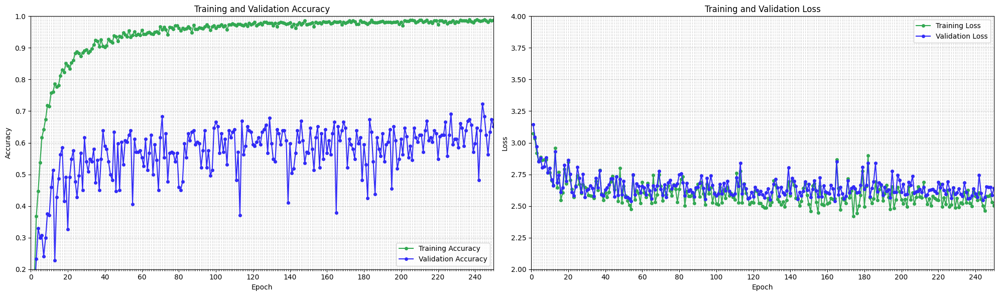

In [20]:
print("Beginning training...")
for epoch in range(num_epochs):
  progress_bar = tqdm(train_loader, total=total_steps, leave=True)
  total_correct = 0
  total_samples = 0
  for i, (inputs, labels) in enumerate(progress_bar):
    inputs = inputs.to(device)
    labels = labels.to(device)
    predictions = model(inputs)
    if debug == True:
      print('*** DEBUG ***')
      print('Predictions: ', predictions.shape)
      print('Labels: ', labels.shape)
      print('Inputs: ', inputs.shape)
      print()

    loss = loss_function(predictions, labels)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    _, predicted_labels = torch.max(predictions, 1)
    total_correct += (predicted_labels == labels).sum().item()
    total_samples += labels.size(0)

    progress_bar.set_description(f"Epoch [{epoch+1}/{num_epochs}]")
    progress_bar.set_postfix(loss=loss.item())

  model.eval()
  with torch.no_grad():
    val_loss = 0
    val_correct = 0
    val_samples = 0
    for inputs, labels in test_loader:
      inputs = inputs.to(device)
      labels = labels.to(device)

      predictions = model(inputs)
      loss = loss_function(predictions, labels)

      _, predicted_labels = torch.max(predictions, 1)
      val_correct += (predicted_labels == labels).sum().item()
      val_samples += labels.size(0)
      val_loss += loss.item()

    val_loss /= len(test_loader)
    val_accuracy = val_correct / val_samples
    accuracy = total_correct / total_samples

    if use_scheduler:
      scheduler.step()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss:.4f}, Acc: {accuracy:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.4f}")

  if display_graphs_bool == True:
    display_graphs(epoch, accuracy, val_accuracy, loss, val_loss, checkpoint_dir)
  if display_graphs_zoomed_bool == True:
    display_graphs_zoomed(epoch, accuracy, val_accuracy, loss, val_loss, checkpoint_dir)

  save_checkpoint(epoch, model, optimizer, loss, val_loss, accuracy, val_accuracy)
  save_model(epoch, model, optimizer, loss, val_loss, accuracy, val_accuracy)

  model.train()

#### ResNet18 - Trimmed - Bandpass

Highest validation accuracy: 0.5803571428571429 at epoch: 154


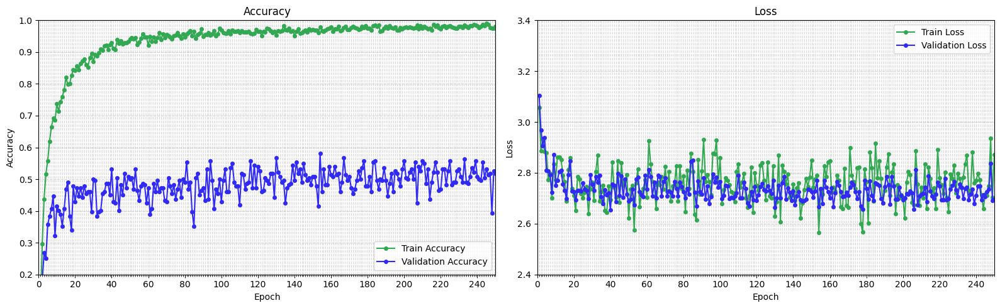

In [30]:
df = pd.read_csv(r'ModelSaves\ResNet18\M1\metrics.csv')

# Find the maximum validation accuracy and the corresponding epoch
max_val_accuracy = df['Validation Accuracy'].max()
max_val_epoch = df[df['Validation Accuracy'] == max_val_accuracy]['Epoch'].values[0]
print(f'Highest validation accuracy: {max_val_accuracy} at epoch: {max_val_epoch}')

# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 2, figsize=(16, 5))

# Plot the accuracy
axs[0].plot(df['Epoch'], df['Train Accuracy'], label='Train Accuracy', marker='o', markersize=4, color='#32a852')
axs[0].plot(df['Epoch'], df['Validation Accuracy'], label='Validation Accuracy', marker='o', markersize=4, color='#312af7')
axs[0].set_xlabel('Epoch')
axs[0].set_ylabel('Accuracy')
axs[0].set_title('Accuracy')
axs[0].set_ylim(acc_min_y, 1)
axs[0].set_xlim(1, num_epochs)
axs[0].legend()
major_ticks = np.arange(0, num_epochs + 1, major_tick_spacing)
minor_ticks = np.arange(0, num_epochs + 1, 1)
axs[0].set_xticks(major_ticks)
axs[0].set_xticks(minor_ticks, minor=True)
axs[0].set_xticklabels(major_ticks.astype(int))
axs[0].grid(True, which='both', linestyle='--', alpha=0.5)

# Plot the loss
axs[1].plot(df['Epoch'], df['Train Loss'], label='Train Loss', marker='o', markersize=4, color='#32a852')
axs[1].plot(df['Epoch'], df['Validation Loss'], label='Validation Loss', marker='o', markersize=4, color='#312af7')
axs[1].set_xlabel('Epoch')
axs[1].set_ylabel('Loss')
axs[1].set_title('Loss')
axs[1].set_ylim(2.4, 3.4)
axs[1].set_xlim(1, num_epochs)
axs[1].legend()
major_ticks = np.arange(0, num_epochs + 1, major_tick_spacing)
minor_ticks = np.arange(0, num_epochs + 1, 1)
axs[1].set_xticks(major_ticks)
axs[1].set_xticks(minor_ticks, minor=True)
axs[1].set_xticklabels(major_ticks.astype(int))
axs[1].grid(True, which='both', linestyle='--', alpha=0.5)

# Show the plots
plt.tight_layout()
plt.show()


#### ResNet18 - Trimmed - Bandpass - 194 x 194

Highest validation accuracy: 0.7232142857142857 at epoch: 244


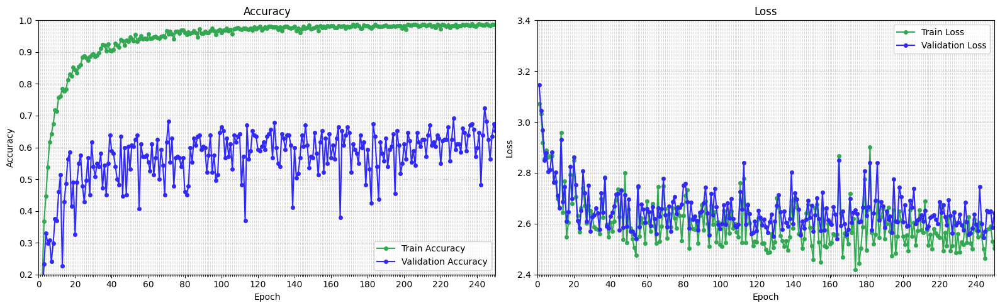

In [31]:
# Load the CSV file
df = pd.read_csv(r'ModelSaves\ResNet18\M2\metrics.csv')

# Find the maximum validation accuracy and the corresponding epoch
max_val_accuracy = df['Validation Accuracy'].max()
max_val_epoch = df[df['Validation Accuracy'] == max_val_accuracy]['Epoch'].values[0]
print(f'Highest validation accuracy: {max_val_accuracy} at epoch: {max_val_epoch}')

# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 2, figsize=(16, 5))

# Plot the accuracy
axs[0].plot(df['Epoch'], df['Train Accuracy'], label='Train Accuracy', marker='o', markersize=4, color='#32a852')
axs[0].plot(df['Epoch'], df['Validation Accuracy'], label='Validation Accuracy', marker='o', markersize=4, color='#312af7')
axs[0].set_xlabel('Epoch')
axs[0].set_ylabel('Accuracy')
axs[0].set_title('Accuracy')
axs[0].set_ylim(acc_min_y, 1)
axs[0].set_xlim(1, num_epochs)
axs[0].legend()
major_ticks = np.arange(0, num_epochs + 1, major_tick_spacing)
minor_ticks = np.arange(0, num_epochs + 1, 1)
axs[0].set_xticks(major_ticks)
axs[0].set_xticks(minor_ticks, minor=True)
axs[0].set_xticklabels(major_ticks.astype(int))
axs[0].grid(True, which='both', linestyle='--', alpha=0.5)

# Plot the loss
axs[1].plot(df['Epoch'], df['Train Loss'], label='Train Loss', marker='o', markersize=4, color='#32a852')
axs[1].plot(df['Epoch'], df['Validation Loss'], label='Validation Loss', marker='o', markersize=4, color='#312af7')
axs[1].set_xlabel('Epoch')
axs[1].set_ylabel('Loss')
axs[1].set_title('Loss')
axs[1].set_ylim(2.4, 3.4)
axs[1].set_xlim(1, num_epochs)
axs[1].legend()
major_ticks = np.arange(0, num_epochs + 1, major_tick_spacing)
minor_ticks = np.arange(0, num_epochs + 1, 1)
axs[1].set_xticks(major_ticks)
axs[1].set_xticks(minor_ticks, minor=True)
axs[1].set_xticklabels(major_ticks.astype(int))
axs[1].grid(True, which='both', linestyle='--', alpha=0.5)

# Show the plots
plt.tight_layout()
plt.show()
